In [1]:
#Project Phase 1: Data Collection + Cleaning + Preprocessing

#1. Load Kaggle Datasets
#2. Fetch Live Data from Twitter/X API v2
#3. Clean + Preprocess All Data

In [2]:
# Required Libraries
import pandas as pd
import numpy as np
import re
from collections import Counter
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt


import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter


In [3]:
import pandas as pd

# Load MVSA Enriched Dataset (Excel format)
df_mvsa = pd.read_excel("/content/LabeledText.xlsx")  # Replace with your actual path

# Rename columns to standard format
df_mvsa.rename(columns={"caption": "text", "sentiment_label": "sentiment"}, inplace=True)


print("Actual Columns in MVSA Excel file:")
print(df_mvsa.columns)



Actual Columns in MVSA Excel file:
Index(['File Name', 'Caption', 'LABEL'], dtype='object')


In [4]:

# Download stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Load the MVSA dataset
mvsa_df = pd.read_excel("/content/LabeledText.xlsx")  # Change to your file path

# Preview the data
print("Columns in Dataset:", mvsa_df.columns.tolist())
print(mvsa_df.head())

# Rename columns for consistency
mvsa_df.rename(columns={
    "Caption": "tweet_content",
    "LABEL": "sentiment"
}, inplace=True)

# Drop unnecessary columns
mvsa_df.drop(columns=["File Name"], inplace=True)

# Map string sentiment to numeric
sentiment_map = {"positive": 1, "negative": -1, "neutral": 0}
mvsa_df["sentiment_score"] = mvsa_df["sentiment"].map(sentiment_map)

# Define clean_text function
def clean_text(text):
    text = text.lower()
    text = re.sub(r"http\S+|www\S+|https\S+", '', text)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'[^a-zA-Z0-9\s#]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    words = text.split()
    words = [word for word in words if word not in stop_words]
    return ' '.join(words)

# Apply cleaning
mvsa_df["clean_tweet"] = mvsa_df["tweet_content"].astype(str).apply(clean_text)

# Save cleaned data
mvsa_df.to_csv("mvsa_df.csv", index=False)

# Preview
print(" Cleaned MVSA Data:")
display(mvsa_df.head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Columns in Dataset: ['File Name', 'Caption', 'LABEL']
  File Name                                            Caption     LABEL
0     1.txt      How I feel today #legday #jelly #aching #gym   negative
1    10.txt  @ArrivaTW absolute disgrace two carriages from...  negative
2   100.txt  This is my Valentine's from 1 of my nephews. I...  positive
3  1000.txt  betterfeelingfilms: RT via Instagram: First da...   neutral
4  1001.txt         Zoe's first love #Rattled @JohnnyHarper15   positive
 Cleaned MVSA Data:


,tweet_content,sentiment,sentiment_score,clean_tweet
0,How I feel today #legday #jelly #aching #gym,negative,-1,feel today #legday #jelly #aching #gym
1,@ArrivaTW absolute disgrace two carriages from...,negative,-1,absolute disgrace two carriages bangor half wa...
2,This is my Valentine's from 1 of my nephews. I...,positive,1,valentines 1 nephews elated sometimes little t...
3,betterfeelingfilms: RT via Instagram: First da...,neutral,0,betterfeelingfilms rt via instagram first day ...
4,Zoe's first love #Rattled @JohnnyHarper15,positive,1,zoes first love #rattled


In [5]:

# Download NLTK stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Load the dataset
df1 = pd.read_csv("/content/twitter sentiment analysis.csv")  # Update the path if needed

# Show column names
print("Columns in Dataset:", df1.columns)

# Standardize column names
# Rename columns to standard names for consistency
df1.rename(columns={
    'Text': 'tweet_content',
    'Label': 'sentiment'
}, inplace=True)

# Drop NaN and duplicates
df1.dropna(subset=['tweet_content', 'sentiment'], inplace=True)
df1.drop_duplicates(inplace=True)

# Map sentiment to score
sentiment_map = {
    'Positive': 1,
    'Negative': -1,
    'Neutral': 0
}
df1['sentiment_score'] = df1['sentiment'].map(lambda x: sentiment_map.get(str(x).capitalize(), 0))

# Clean text
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+|https\S+", '', text)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'[^a-zA-Z0-9\s#]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    words = text.split()
    words = [word for word in words if word not in stop_words]
    return ' '.join(words)

# Apply cleaning
df1['clean_tweet'] = df1['tweet_content'].apply(clean_text)

# Save cleaned dataset
df1.to_csv("df1.csv", index=False)

# Display sample
print("\n Cleaned Twitter Sentiment Dataset Sample:")
display(df1.head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Columns in Dataset: Index(['Text', 'Label'], dtype='object')

 Cleaned Twitter Sentiment Dataset Sample:


,tweet_content,sentiment,sentiment_score,clean_tweet
0,rwanda is set to host the headquarters of unit...,positive,1,rwanda set host headquarters united nations de...
1,it sucks for me since im focused on the nature...,negative,-1,sucks since im focused nature aspect things en...
2,shawntarloff itsmieu you can also relate this ...,neutral,0,shawntarloff itsmieu also relate art lot peopl...
3,social security constant political crises dist...,negative,-1,social security constant political crises dist...
4,filmthepolicela a broken rib can puncture a lu...,negative,-1,filmthepolicela broken rib puncture lung lead ...


In [6]:
!pip install tweepy --quiet


In [7]:
import tweepy
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

# Twitter API credentials
bearer_token = "AAAAAAAAAAAAAAAAAAAAAG3M0AEAAAAAsOQmX5EcdQkFQ8YfcDMAO8V0ozs%3D2EcaMfGPJw6Rmw022YZ3C2745LKqVoVGSnWdhJTNpaicLrBdfh"  # 🔒 Replace this with your actual token

# Setup Tweepy Client
client = tweepy.Client(bearer_token=bearer_token, wait_on_rate_limit=True)
stop_words = set(stopwords.words("english"))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
def fetch_tweets(query, max_results=100):
    tweets_data = []

    for tweet in tweepy.Paginator(
        client.search_recent_tweets,
        query=query,
        tweet_fields=['text', 'created_at', 'lang'],
        max_results=100
    ).flatten(limit=max_results):
        if tweet.lang == 'en':
            tweets_data.append({
                'tweet_content': tweet.text,
                'created_at': tweet.created_at
            })

    return pd.DataFrame(tweets_data)


In [9]:
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r"http\S+|www\S+|https\S+", '', text)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'[^a-zA-Z0-9\s#]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    words = text.split()
    words = [word for word in words if word not in stop_words]
    return ' '.join(words)


In [10]:
import time

def fetch_tweets_safe(query, max_results=300):
    tweets_data = []
    try:
        for tweet in tweepy.Paginator(
            client.search_recent_tweets,
            query=query,
            tweet_fields=['text', 'created_at', 'lang'],
            max_results=100
        ).flatten(limit=max_results):
            if tweet.lang == 'en':
                tweets_data.append({
                    'tweet_content': tweet.text,
                    'created_at': tweet.created_at
                })
    except tweepy.TooManyRequests:
        print("⏳ Rate limit hit. Sleeping for 15 mins...")
        time.sleep(900)
        return fetch_tweets_safe(query, max_results)  # retry

    return pd.DataFrame(tweets_data)


In [11]:
#EDA & Viz
#Sentiment dist
# Word frequency
#WordCloud
#Hashtag analysis
#Tweet length insights

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import re
import plotly.express as px
import plotly.graph_objs as go


In [13]:
# Combine both cleaned datasets
df1['source'] = 'Kaggle'
mvsa_df['source'] = 'MVSA'
df1 = df1[['clean_tweet', 'sentiment', 'source']]
mvsa_df = mvsa_df[['clean_tweet', 'sentiment', 'source']]
combined_df = pd.concat([df1, mvsa_df], ignore_index=True)

# Compute tweet length
combined_df['tweet_length'] = combined_df['clean_tweet'].apply(len)


<ipython-input-14-c02ffaeb1781>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=combined_df, x='sentiment', palette='Set2')


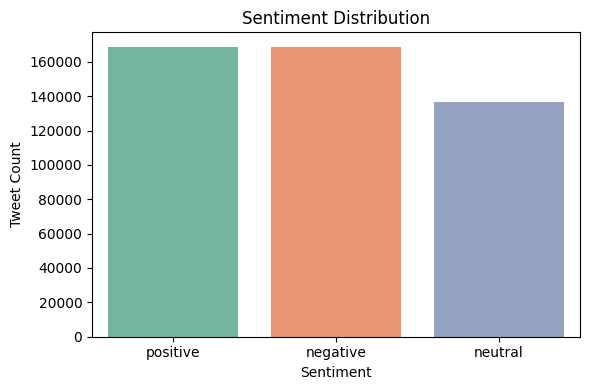

In [14]:
# ========== 1. Sentiment Distribution ==========
plt.figure(figsize=(6,4))
sns.countplot(data=combined_df, x='sentiment', palette='Set2')
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Tweet Count")
plt.tight_layout()
plt.show()


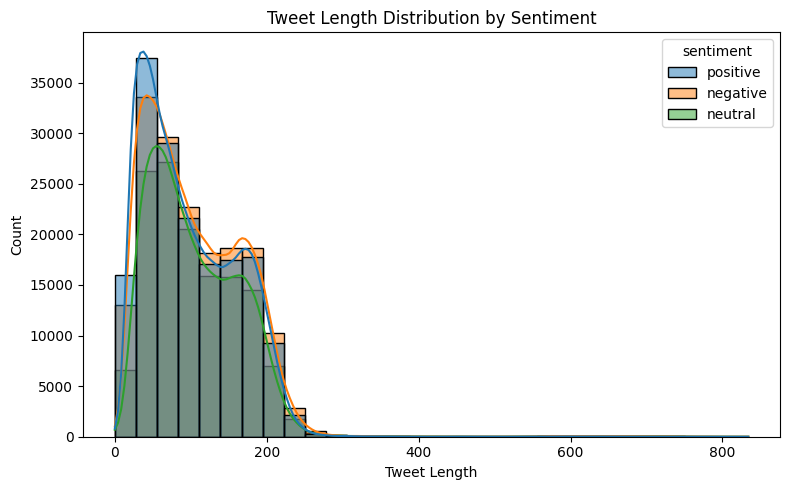

In [15]:
# ========== 2. Tweet Length Distribution ==========
plt.figure(figsize=(8,5))
sns.histplot(data=combined_df, x='tweet_length', hue='sentiment', bins=30, kde=True)
plt.title("Tweet Length Distribution by Sentiment")
plt.xlabel("Tweet Length")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


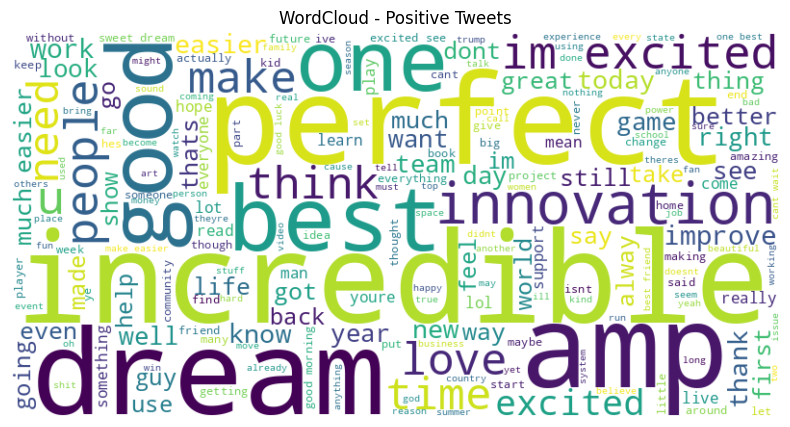

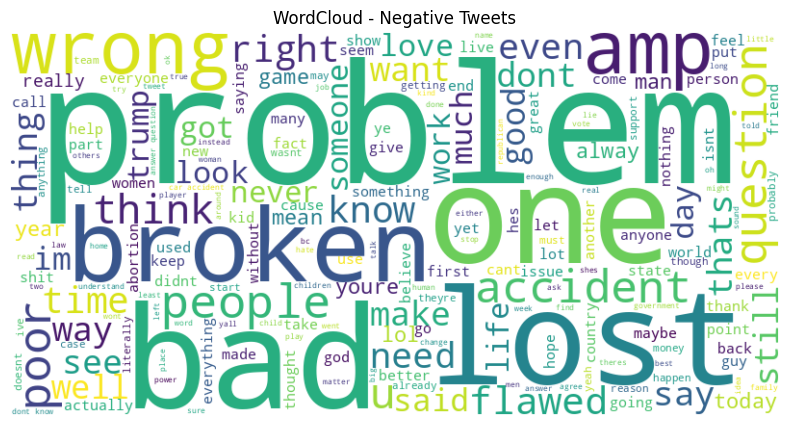

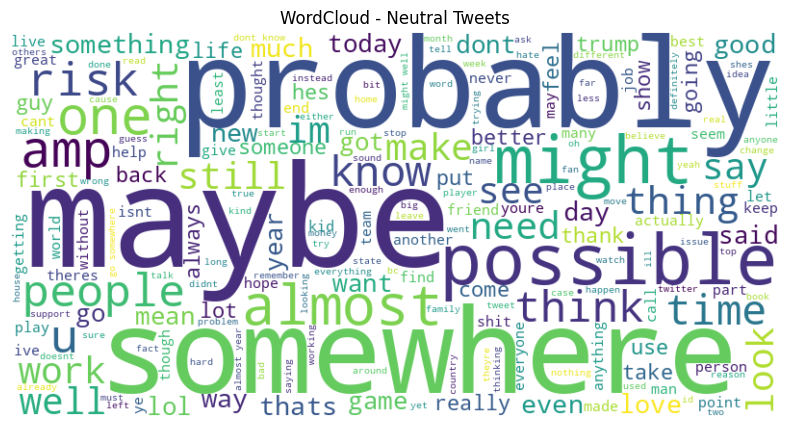

In [16]:
# ========== 3. Word Clouds for Each Sentiment ==========
for sentiment in ['positive', 'negative', 'neutral']:
    text = ' '.join(combined_df[combined_df['sentiment'] == sentiment]['clean_tweet'])
    wc = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud - {sentiment.capitalize()} Tweets")
    plt.show()


<ipython-input-17-bf7b1bd4c0e3>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='hashtag', data=hashtags_df, palette='coolwarm')


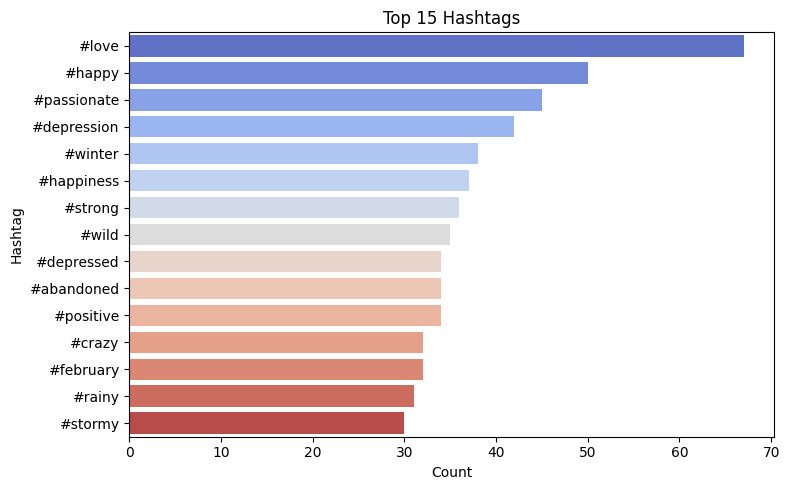

In [17]:
# ========== 4. Hashtag Extraction ==========
def extract_hashtags(text):
    return re.findall(r"#\w+", text)

combined_df['hashtags'] = combined_df['clean_tweet'].apply(extract_hashtags)
all_hashtags = [hashtag.lower() for hashtags in combined_df['hashtags'] for hashtag in hashtags]
hashtag_freq = Counter(all_hashtags).most_common(15)
hashtags_df = pd.DataFrame(hashtag_freq, columns=['hashtag', 'count'])

plt.figure(figsize=(8,5))
sns.barplot(x='count', y='hashtag', data=hashtags_df, palette='coolwarm')
plt.title("Top 15 Hashtags")
plt.xlabel("Count")
plt.ylabel("Hashtag")
plt.tight_layout()
plt.show()

<ipython-input-18-21246b991315>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='word', data=words_df, palette='viridis')


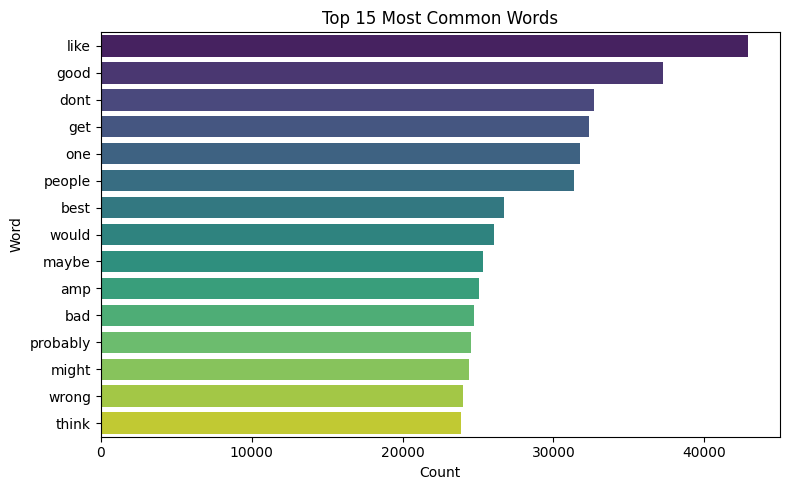

In [18]:
# ========== 5. Most Common Words ==========
def extract_words(text):
    return re.findall(r'\b\w{3,}\b', text.lower())

all_words = [word for tweet in combined_df['clean_tweet'] for word in extract_words(tweet)]
word_freq = Counter(all_words).most_common(15)
words_df = pd.DataFrame(word_freq, columns=['word', 'count'])

plt.figure(figsize=(8,5))
sns.barplot(x='count', y='word', data=words_df, palette='viridis')
plt.title("Top 15 Most Common Words")
plt.xlabel("Count")
plt.ylabel("Word")
plt.tight_layout()
plt.show()


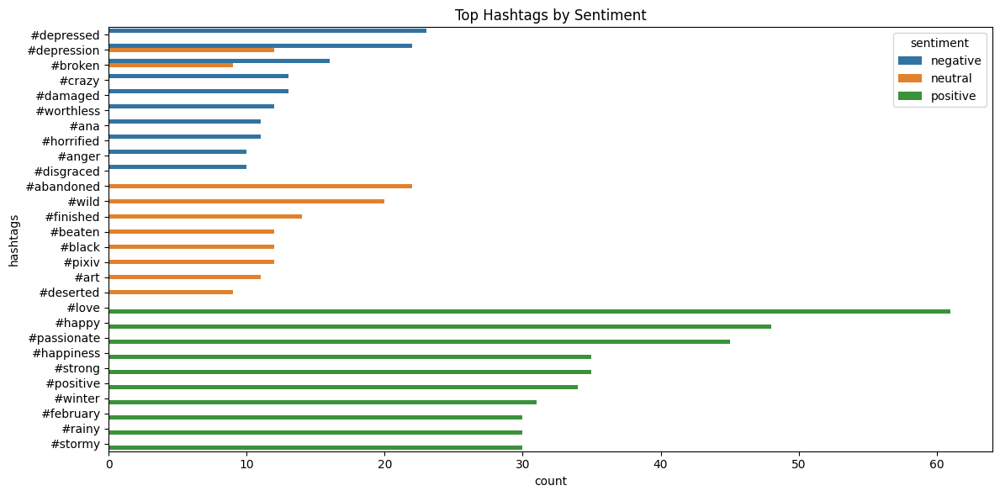

In [19]:
# ========== 6. Sentiment-wise Hashtag Analysis ==========
sentiment_hashtag_df = combined_df.explode('hashtags')
sentiment_hashtag_df['hashtags'] = sentiment_hashtag_df['hashtags'].str.lower()
top_sentiment_hashtags = (
    sentiment_hashtag_df.groupby(['sentiment', 'hashtags'])
    .size()
    .reset_index(name='count')
    .sort_values(['sentiment', 'count'], ascending=[True, False])
    .groupby('sentiment')
    .head(10)
)

plt.figure(figsize=(12,6))
sns.barplot(x='count', y='hashtags', hue='sentiment', data=top_sentiment_hashtags)
plt.title("Top Hashtags by Sentiment")
plt.tight_layout()
plt.show()


In [20]:
# ========== 7. Mini Dashboard using Plotly ==========
# 7.1 Pie chart for sentiment dist
fig1 = px.pie(combined_df, names='sentiment', title='Sentiment Distribution')

# 7.2 Box plot of tweet lengths by sentiment
fig2 = px.box(combined_df, x='sentiment', y='tweet_length', title='Tweet Length by Sentiment')

# 7.3 Bar chart for top hashtags
fig3 = px.bar(hashtags_df.sort_values(by='count', ascending=False), x='hashtag', y='count',
              title='Top 15 Hashtags', color='count', color_continuous_scale='Plasma')

# 7.4 Sentiment-wise hashtag treemap
fig4 = px.treemap(top_sentiment_hashtags, path=['sentiment', 'hashtags'], values='count',
                  title='Sentiment-wise Hashtag Usage')

# Show all plots
fig1.show()
fig2.show()
fig3.show()
fig4.show()

In [21]:
#Import + Load Cleaned Data


import pandas as pd
from sklearn.model_selection import train_test_split

# Load cleaned CSVs
df_kaggle = pd.read_csv("df1.csv")
df_mvsa = pd.read_csv("mvsa_df.csv")

# Standardize columns
df_kaggle['source'] = 'Kaggle'
df_mvsa['source'] = 'MVSA'

# Keep only what's needed
df_kaggle = df_kaggle[['clean_tweet', 'sentiment', 'source']]
df_mvsa = df_mvsa[['clean_tweet', 'sentiment', 'source']]

# Combine datasets
df = pd.concat([df_kaggle, df_mvsa], ignore_index=True)
print("Combined Dataset Size:", df.shape)


Combined Dataset Size: (473505, 3)


In [22]:
# Convert sentiment to numeric
sentiment_map = {"positive": 1, "negative": -1, "neutral": 0}
df['sentiment_score'] = df['sentiment'].map(sentiment_map)


In [23]:
from sklearn.model_selection import train_test_split

X = df['clean_tweet']
y = df['sentiment_score']

# Stratified split to maintain sentiment balance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)


In [24]:
# Drop NaNs in training and test sets (just in case)
X_train = X_train.dropna()
y_train = y_train.loc[X_train.index]  # Keep alignment

X_test = X_test.dropna()
y_test = y_test.loc[X_test.index]


In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1,2))
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)


In [26]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

model = LogisticRegression(max_iter=200)
model.fit(X_train_vec, y_train)

# Predictions
y_pred = model.predict(X_test_vec)

# Results
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

          -1       0.96      0.97      0.96     33740
           0       0.96      0.95      0.96     27265
           1       0.98      0.97      0.97     33679

    accuracy                           0.96     94684
   macro avg       0.96      0.96      0.96     94684
weighted avg       0.96      0.96      0.96     94684

Confusion Matrix:
 [[32698   690   352]
 [  771 26038   456]
 [  571   532 32576]]


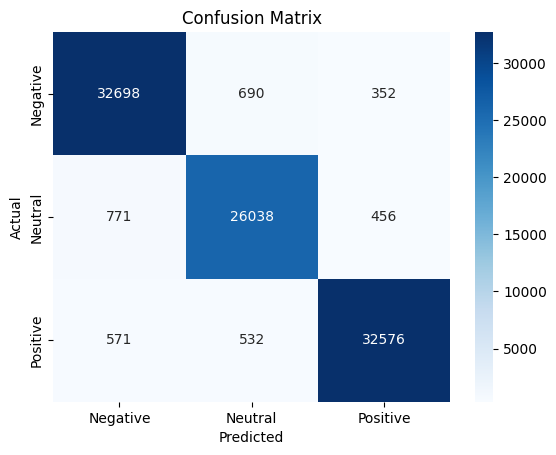

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Negative", "Neutral", "Positive"],
            yticklabels=["Negative", "Neutral", "Positive"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title("Confusion Matrix")
plt.show()


In [28]:
#ML MODELS

In [29]:
from sklearn.linear_model import PassiveAggressiveClassifier, SGDClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize models
pac = PassiveAggressiveClassifier(max_iter=1000, random_state=42)
sgd = SGDClassifier(loss='log_loss', penalty='l2', max_iter=1000, random_state=42)

# Fit models
pac.fit(X_train_vec, y_train)
sgd.fit(X_train_vec, y_train)

# Predictions
pac_pred = pac.predict(X_test_vec)
sgd_pred = sgd.predict(X_test_vec)

# Evaluation
pac_acc = accuracy_score(y_test, pac_pred)
sgd_acc = accuracy_score(y_test, sgd_pred)

print("===== Passive Aggressive Classifier Report =====")
print(classification_report(y_test, pac_pred))

print("===== SGD Classifier Report =====")
print(classification_report(y_test, sgd_pred))


===== Passive Aggressive Classifier Report =====
              precision    recall  f1-score   support

          -1       0.97      0.96      0.96     33740
           0       0.95      0.96      0.95     27265
           1       0.97      0.97      0.97     33679

    accuracy                           0.96     94684
   macro avg       0.96      0.96      0.96     94684
weighted avg       0.96      0.96      0.96     94684

===== SGD Classifier Report =====
              precision    recall  f1-score   support

          -1       0.96      0.96      0.96     33740
           0       0.95      0.95      0.95     27265
           1       0.97      0.96      0.97     33679

    accuracy                           0.96     94684
   macro avg       0.96      0.96      0.96     94684
weighted avg       0.96      0.96      0.96     94684



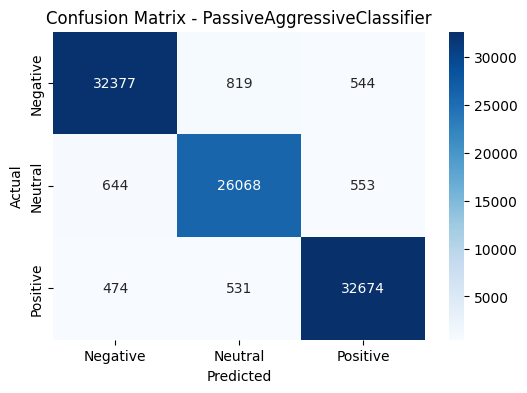

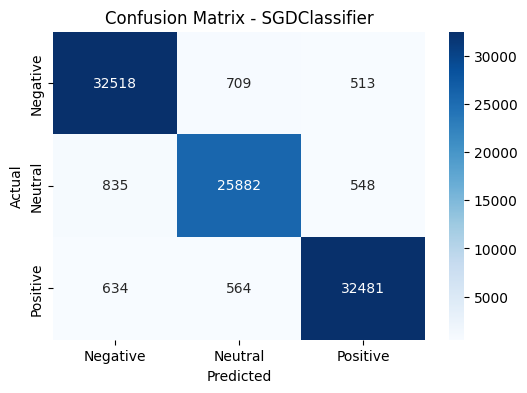

In [30]:
#Plotting Confusion Matrices:

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrices
pac_cm = confusion_matrix(y_test, pac_pred)
sgd_cm = confusion_matrix(y_test, sgd_pred)

# Plot Confusion Matrix for PassiveAggressiveClassifier
plt.figure(figsize=(6, 4))
sns.heatmap(pac_cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Negative', 'Neutral', 'Positive'], yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title("Confusion Matrix - PassiveAggressiveClassifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot Confusion Matrix for SGDClassifier
plt.figure(figsize=(6, 4))
sns.heatmap(sgd_cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Negative', 'Neutral', 'Positive'], yticklabels=['Negative', 'Neutral', 'Positive'])
plt.title("Confusion Matrix - SGDClassifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


In [31]:
#Hyperparameter Tuning:
from sklearn.model_selection import GridSearchCV

# Hyperparameters for PassiveAggressiveClassifier
pac_param_grid = {
    'max_iter': [500, 1000, 1500],
    'C': [0.1, 1, 10],  # Regularization strength
    'tol': [1e-3, 1e-4]  # Tolerance for stopping criteria
}

# Hyperparameters for SGDClassifier
sgd_param_grid = {
    'max_iter': [500, 1000, 1500],
    'alpha': [0.0001, 0.001, 0.01],  # Regularization term
    'penalty': ['l2', 'elasticnet'],  # Regularization types
    'learning_rate': ['constant', 'optimal', 'invscaling']  # Learning rate schedules
}

# GridSearchCV for PassiveAggressiveClassifier
pac_grid_search = GridSearchCV(estimator=PassiveAggressiveClassifier(), param_grid=pac_param_grid, cv=3, verbose=2, n_jobs=-1)
pac_grid_search.fit(X_train_vec, y_train)

# GridSearchCV for SGDClassifier
sgd_grid_search = GridSearchCV(estimator=SGDClassifier(), param_grid=sgd_param_grid, cv=3, verbose=2, n_jobs=-1)
sgd_grid_search.fit(X_train_vec, y_train)

# Get the best parameters and scores
print("===== Best Parameters for PassiveAggressiveClassifier =====")
print(pac_grid_search.best_params_)
print("Best Cross-Validation Score: ", pac_grid_search.best_score_)

print("===== Best Parameters for SGDClassifier =====")
print(sgd_grid_search.best_params_)
print("Best Cross-Validation Score: ", sgd_grid_search.best_score_)



Fitting 3 folds for each of 18 candidates, totalling 54 fits
Fitting 3 folds for each of 54 candidates, totalling 162 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


108 fits failed out of a total of 162.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
108 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_stochastic_gradient.py", line 930, in fit
    self._mo

===== Best Parameters for PassiveAggressiveClassifier =====
{'C': 0.1, 'max_iter': 500, 'tol': 0.001}
Best Cross-Validation Score:  0.9637518714205369
===== Best Parameters for SGDClassifier =====
{'alpha': 0.0001, 'learning_rate': 'optimal', 'max_iter': 1500, 'penalty': 'l2'}
Best Cross-Validation Score:  0.9601397327334226


PassiveAggressiveClassifier has the ability to maintain better accuracy and lower misclassification (especially for the Positive class) makes it the more reliable choice overall.

In [32]:
import pickle

# Assuming 'model' is your trained PassiveAggressiveClassifier
with open('passive_aggressive_model.pkl', 'wb') as model_file:
    pickle.dump(model, model_file)


In [33]:
# Load the trained PassiveAggressiveClassifier model
with open('passive_aggressive_model.pkl', 'rb') as model_file:
    model = pickle.load(model_file)


In [34]:
import pickle

# Assuming 'vectorizer' is your trained TfidfVectorizer
with open('tfidf_vectorizer.pkl', 'wb') as vectorizer_file:
    pickle.dump(vectorizer, vectorizer_file)


In [35]:
# Load the vectorizer used during training
with open('tfidf_vectorizer.pkl', 'rb') as vectorizer_file:
    vectorizer = pickle.load(vectorizer_file)


In [36]:
## Deep Learning Models

In [37]:
##Prepping Text for CNN + LSTM


from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Parameters
vocab_size = 10000   # Max number of unique words to keep (like a tight VIP list)
max_length = 100     # Max tweet length in tokens (short and punchy, like a tweet should be)
oov_token = "<OOV>"  # Out-of-Vocabulary token

# 1. Initialize Tokenizer
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_token)
tokenizer.fit_on_texts(X_train)

# 2. Convert text to sequences of integers
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# 3. Pad sequences to the same length
X_train_pad = pad_sequences(X_train_seq, maxlen=max_length, padding='post', truncating='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=max_length, padding='post', truncating='post')


In [38]:
# Sanity Check: Tokenizer & Padding
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define the Tokenizer and fit it on the training data
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)  # X_train is your text data

vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size:", vocab_size)

# Convert texts to sequences
X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# Pad the sequences to ensure equal length
max_len = 100  # max length for padding, adjust as necessary
X_train_padded = pad_sequences(X_train_seq, maxlen=max_len)
X_test_padded = pad_sequences(X_test_seq, maxlen=max_len)

# Print some results to confirm the process
print(f"Vocabulary Size: {len(tokenizer.word_index)}")
print(f"Sample Tokenized Text: {X_train_seq[0]}")
print(f"Sample Padded Text: {X_train_padded[0]}")
print(f"Shape of Padded Training Data: {X_train_padded.shape}")
print(f"Shape of Padded Test Data: {X_test_padded.shape}")


Vocabulary Size: 450300
Vocabulary Size: 450299
Sample Tokenized Text: [38, 296, 11, 11, 32, 2965, 442, 152, 296, 42, 2965, 52, 11, 219, 14, 5, 33, 11, 105, 1510]
Sample Padded Text: [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0   38  296   11   11
   32 2965  442  152  296   42 2965   52   11  219   14    5   33   11
  105 1510]
Shape of Padded Training Data: (378723, 100)
Shape of Padded Test Data: (94684, 100)


In [39]:
max_words = vocab_size  # just for clarity
embedding_dim = 100


In [40]:
# Define constants based on your vectorization step
max_words = vocab_size             # or whatever value you printed earlier (581994)
embedding_dim = 100               # Can be 50, 100, 200, or 300 — 100 is usually a good start
max_sequence_length = X_train_padded.shape[1]  # Should be 100 based on your earlier output


In [41]:
y_train = y_train.replace({-1: 0, 0: 1, 1: 2})
y_test = y_test.replace({-1: 0, 0: 1, 1: 2})


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Define model
model = Sequential()

# 1. Embedding layer
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim))


# 2. Convolutional layer
model.add(Conv1D(filters=128, kernel_size=5, activation='relu'))

# 3. MaxPooling
model.add(MaxPooling1D(pool_size=2))

# 4. Bi-directional LSTM
model.add(Bidirectional(LSTM(units=64, return_sequences=False)))

# 5. Dense layers
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))  # 3 classes: -1, 0, 1

# Compile model
model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(learning_rate=1e-4),
              metrics=['accuracy'])

# Early stopping to prevent overfitting
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train
history = model.fit(X_train_padded, y_train,
                    epochs=10,
                    batch_size=256,
                    validation_split=0.2,
                    callbacks=[early_stop],
                    verbose=1)

# Evaluate
y_pred_probs = model.predict(X_test_padded)
y_pred = np.argmax(y_pred_probs, axis=1)

# Classification Report
print("===== CNN + BiLSTM Classification Report =====")
print(classification_report(y_test, y_pred, digits=4))


Epoch 1/10
 244/1184 ━━━━━━━━━━━━━━━━━━━━ 16:49 1s/step - accuracy: 0.4195 - loss: 1.0653

In [ ]:
# Save model in the newer .keras format
model.save('cnn_lstm_sentiment_model.keras')  # New hotness

# Save tokenizer as usual
import pickle
with open('tokenizer.pkl', 'wb') as handle:
    pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [ ]:
import time
import tweepy
from tweepy.errors import TooManyRequests
import json
import os

def get_safe_tweets(client, query, max_results=10):
    tweets = []
    while True:
        try:
            response = client.search_recent_tweets(query=query, max_results=max_results, tweet_fields=['created_at', 'text', 'author_id', 'lang'])
            tweets.extend(response.data if response.data else [])
            break  # success
        except TooManyRequests:
            print(" Rate limit hit. Sleeping for 15 minutes...")
            time.sleep(15 * 60)
        except Exception as e:
            print(" Error:", e)
            break
    return tweets


In [ ]:
def fetch_multiple_queries(client, queries, max_results=10, sleep_time=5):
    all_tweets = []
    for query in queries:
        print(f" Fetching tweets for: {query}")
        tweets = get_safe_tweets(client, query, max_results)
        all_tweets.extend(tweets)
        print(f" Got {len(tweets)} tweets. Sleeping for {sleep_time} sec to avoid spam.")
        time.sleep(sleep_time)  # cooldown between queries
    return all_tweets


In [ ]:
def save_tweets_to_json(tweets, filename="cached_tweets.json"):
    tweet_list = [tweet.data for tweet in tweets]  # convert to plain dicts
    with open(filename, 'w', encoding='utf-8') as f:
        json.dump(tweet_list, f, ensure_ascii=False, indent=4)
    print(f" Saved {len(tweet_list)} tweets to {filename}")

def load_cached_tweets(filename="cached_tweets.json"):
    if not os.path.exists(filename):
        print(" No cached file found.")
        return []
    with open(filename, 'r', encoding='utf-8') as f:
        tweet_list = json.load(f)
    print(f" Loaded {len(tweet_list)} cached tweets from {filename}")
    return tweet_list


In [ ]:
import random

def stream_fake_tweets(cached_tweets, delay=3):
    print(" Simulating live tweet stream...")
    for tweet in random.sample(cached_tweets, min(10, len(cached_tweets))):
        print("📝", tweet['text'])
        time.sleep(delay)  # simulate live feel


In [ ]:
cached_tweets = load_cached_tweets("mock_tweets.json")
stream_fake_tweets(cached_tweets, delay=2)  # simulate live tweets


In [ ]:
##========Real-time(ish) tweet simulation==========#

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Assuming tokenizer and model are already loaded globally
MAX_SEQUENCE_LENGTH = 300  # or whatever you used in training

def predict_sentiment(text, model, tokenizer):
    # Tokenize and pad
    sequence = tokenizer.texts_to_sequences([text])
    padded = pad_sequences(sequence, maxlen=MAX_SEQUENCE_LENGTH, padding='post')

    # Predict
    prediction = model.predict(padded)[0]
    predicted_class = np.argmax(prediction)

    # Map class index to label
    label_map = {0: 'Negative', 1: 'Neutral', 2: 'Positive'}
    return label_map.get(predicted_class, "Unknown")


In [ ]:
##=======Saving predictions for later plotting========#

In [ ]:
import json
from datetime import datetime
from google.colab import files

def log_predictions(predictions, filename="sentiment_log.json"):
    # Save JSON to working directory (which is /content/ in Colab)
    with open(filename, 'w') as f:
        json.dump(predictions, f, indent=4)

    print(f"\n Predictions saved to: {filename}")

    # Force download to your local machine
    files.download(filename)


In [ ]:
# Example usage
sample_preds = [
    {"tweet": "I love the vibe here!", "predicted_sentiment": "Positive"},
    {"tweet": "Ugh, this is terrible", "predicted_sentiment": "Negative"},
]

log_predictions(sample_preds)


In [ ]:
#======Stream fake tweets + predict + log=======#

In [ ]:
import random
import time
import json
from datetime import datetime
from google.colab import files

def stream_and_infer(model, tokenizer, cache_file="mock_tweets.json", log_file="sentiment_log.json"):
    # Load cached fake tweets
    with open(cache_file, 'r') as f:
        cached_tweets = json.load(f)

    predictions_log = []

    print("\n Starting fake real-time tweet analysis...\n")
    for tweet in random.sample(cached_tweets, 10):  # simulate 10 tweets
        text = tweet['text']
        print("📝", text)

        sentiment = predict_sentiment(text, model, tokenizer)
        print(" Sentiment:", sentiment)

        log_entry = {
            "text": text,
            "sentiment": sentiment,
            "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        }
        predictions_log.append(log_entry)

        time.sleep(1)  # simulate streaming delay like a Netflix buffer

    # Save predictions
    with open(log_file, 'w') as f:
        json.dump(predictions_log, f, indent=4)

    print(f"\n Predictions saved to: {log_file}")

    # Force download to local system
    files.download(log_file)


In [ ]:
from keras.models import load_model
import pickle

# Load the model
model = load_model('cnn_lstm_sentiment_model.keras')

# Load the tokenizer
with open('tokenizer.pkl', 'rb') as handle:
    tokenizer = pickle.load(handle)


In [ ]:
!pip install requests


In [ ]:
import os
import json
import requests
from datetime import datetime

# ==== CONFIGURATION ====
BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAG3M0AEAAAAAsOQmX5EcdQkFQ8YfcDMAO8V0ozs%3D2EcaMfGPJw6Rmw022YZ3C2745LKqVoVGSnWdhJTNpaicLrBdfh"  # Replace with your token
QUERY = "tech OR AI OR data science -is:retweet lang:en"  # Sample query
MAX_RESULTS = 50  # Twitter API allows up to 100 per request
CACHE_FILE = "cached_tweets.json"


def create_headers(bearer_token):
    return {"Authorization": f"Bearer {bearer_token}"}


def fetch_tweets(query, max_results=50):
    url = "https://api.twitter.com/2/tweets/search/recent"
    params = {
        "query": query,
        "max_results": max_results,
        "tweet.fields": "created_at,lang",
    }
    headers = create_headers(BEARER_TOKEN)
    response = requests.get(url, headers=headers, params=params)

    if response.status_code != 200:
        raise Exception(f"Request returned error {response.status_code}: {response.text}")
    return response.json()


def cache_tweets_to_file(tweet_json, file_path=CACHE_FILE):
    tweets = tweet_json.get("data", [])
    if not tweets:
        print(" No tweets found!")
        return

    cleaned_data = [{"text": tweet["text"], "timestamp": tweet["created_at"]} for tweet in tweets]

    with open(file_path, "w") as f:
        json.dump(cleaned_data, f, indent=4)

    print(f" Cached {len(cleaned_data)} tweets to '{file_path}'.")


def fetch_and_cache_tweets():
    print(" Fetching recent tweets...")
    tweets_json = fetch_tweets(QUERY, MAX_RESULTS)
    cache_tweets_to_file(tweets_json, CACHE_FILE)


In [ ]:
import time
import random

# Tweaking max_results and adding a more aggressive retry and cache mechanism.
def fetch_tweets_with_retry(query, max_results=10, retries=5, backoff_factor=1.5):
    url = "https://api.twitter.com/2/tweets/search/recent"
    params = {
        "query": query,
        "max_results": max_results,  # Limit max results to avoid hitting rate limit
        "tweet.fields": "created_at,lang",
    }
    headers = create_headers(BEARER_TOKEN)

    for attempt in range(retries):
        response = requests.get(url, headers=headers, params=params)

        if response.status_code == 200:
            return response.json()
        elif response.status_code == 429:
            print(f" Rate limit hit. Retrying in {backoff_factor ** attempt:.1f} seconds...")
            time.sleep(backoff_factor ** attempt)  # Exponential backoff
        else:
            raise Exception(f"Request returned error {response.status_code}: {response.text}")

    raise Exception("Max retries exceeded. Try again later.")

def fetch_and_cache_tweets():
    print(" Fetching recent tweets...")
    try:
        tweets_json = fetch_tweets_with_retry(QUERY, max_results=10)  # Reduced max_results
        cache_tweets_to_file(tweets_json, CACHE_FILE)
        print(f" Cached {len(tweets_json['data'])} tweets successfully.")
    except Exception as e:
        print(f" Error: {str(e)}")


In [ ]:
fetch_and_cache_tweets()


In [ ]:
print(df.columns)
df.head()


In [ ]:
import json
from datetime import datetime
from google.colab import files
from tensorflow.keras.models import load_model
import pickle

# 1. Load your trained model & tokenizer
model = load_model('cnn_lstm_sentiment_model.keras')
with open('tokenizer.pkl', 'rb') as f:
    tokenizer = pickle.load(f)

# 2. Regenerate the log with timestamps
def regenerate_sentiment_log(cache_file='mock_tweets.json', log_file='sentiment_log.json'):
    # Load mock (or cached) tweets
    with open(cache_file, 'r') as f:
        tweets = json.load(f)

    predictions = []
    for tweet in tweets:
        text = tweet.get('text') or tweet.get('tweet', '')
        sentiment = predict_sentiment(text, model, tokenizer)
        predictions.append({
            'tweet': text,
            'predicted_sentiment': sentiment,
            'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        })

    # Save to JSON
    with open(log_file, 'w') as f:
        json.dump(predictions, f, indent=4)
    print(f" Logged {len(predictions)} entries with timestamps to {log_file}")

    # Trigger download
    files.download(log_file)

# 3. Run it!
regenerate_sentiment_log()
